In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import torch
from PIL import Image
import random
import os
from tqdm import tqdm, tqdm_notebook
import matplotlib.pyplot as plt

import tensorflow as tf
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.utils import load_img, img_to_array
from keras.applications import vgg16
from keras.models import Model
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.neighbors import NearestNeighbors
from numpy.linalg import norm
import pickle
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import math
import time

### VGG16을 이용한 이미지 임베딩 벡터 추출
##### 마지막 fc layer 이전의 layer를 가져와 우리의 이미지에 대한 벡터 생성

In [3]:
vgg_model = vgg16.VGG16(weights='imagenet')

553467096/553467096 [==============================] - 5s 0us/step


In [4]:
# 이미지 파일 경로
imgs_path = "/content/drive/MyDrive/캡스톤/데이터/포스터/"
imgs_model_width, imgs_model_height = 224, 224

nb_closest_images = 10

# 마지막 레이어를 제거하여 예측 대신 특징 벡터 추출
img_features = Model(inputs=vgg_model.input, outputs=vgg_model.get_layer("fc2").output)

extensions = ['.jpg', '.JPG', '.jpeg', '.JPEG', '.png', '.PNG', '.gif']
files = [imgs_path + x for x in os.listdir(imgs_path) if any(ext in x for ext in extensions)]
print("이미지 수:", len(files))

이미지 수: 127


In [5]:
importedImages = []

for f in files:
    filename = f
    original = load_img(filename, target_size=(imgs_model_width, imgs_model_height))
    numpy_image = img_to_array(original)
    image_batch = np.expand_dims(numpy_image, axis=0)

    importedImages.append(image_batch)

images = np.vstack(importedImages)

processed_imgs = preprocess_input(images.copy())

In [6]:
# extract the images features

# 이미지 특징 추출
imgs_features = img_features.predict(processed_imgs)
print("features successfully extracted!")
imgs_features.shape

4/4 [==============================] - 94s 24s/step
features successfully extracted!


(127, 4096)

In [7]:
x = pd.DataFrame(imgs_features)
x

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
0,0.000000,0.000000,0.00000,0.861699,3.658608,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,2.600020,0.000000,0.000000,0.942020,0.0,1.956625,0.000000,0.000000
1,0.000000,0.000000,0.00000,0.000000,1.518692,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,2.201529,0.989478,0.000000,0.0,0.000000,0.000000,0.116392
2,0.000000,0.800907,0.00000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,2.229650,0.000000,0.0,0.000000,1.648511,0.868380
3,0.000000,0.948940,0.00000,1.628235,2.121703,0.0,0.000000,0.000000,0.000000,0.000000,...,0.302464,0.000000,0.863983,0.000000,0.000000,0.000000,0.0,1.038198,0.000000,0.226773
4,0.000000,0.000000,0.00000,0.000000,4.353264,0.0,0.000000,6.293684,0.000000,6.491461,...,0.000000,3.252698,0.000000,0.533122,0.000000,0.000000,0.0,1.528719,0.000000,1.573097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122,0.000000,0.000000,0.00000,0.542124,3.543475,0.0,1.167105,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.975603,0.000000,0.000000
123,2.821583,0.000000,0.00000,0.000000,2.478270,0.0,0.750457,0.623345,0.000000,0.000000,...,0.000000,0.000000,1.940785,0.000000,2.541257,0.000000,0.0,0.000000,0.000000,4.186625
124,0.087571,0.149728,0.00000,0.000000,4.167222,0.0,0.000000,0.000000,0.000000,0.904329,...,0.000000,0.000000,1.622195,0.000000,0.000000,0.000000,0.0,5.661771,0.159703,0.000000
125,0.000000,0.155026,0.74349,0.969993,3.493989,0.0,1.170362,0.000000,0.000000,0.372829,...,0.000000,0.000000,0.397609,0.000000,0.000000,1.576965,0.0,1.119290,0.000000,0.000000


파일: /content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈칠칠〉.png
--------------------------------------------------------------------
추천 작품명과 유사도:


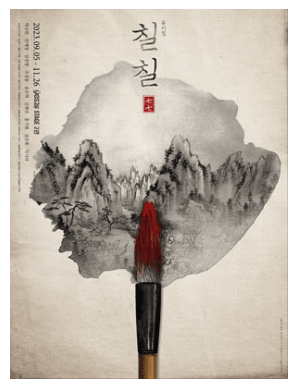

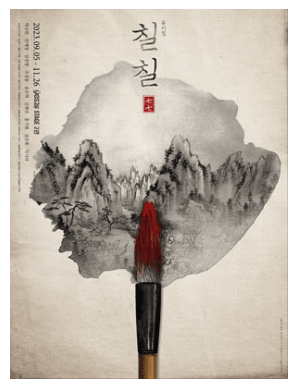

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈칠칠〉.png - 유사도: 0.9999999403953552


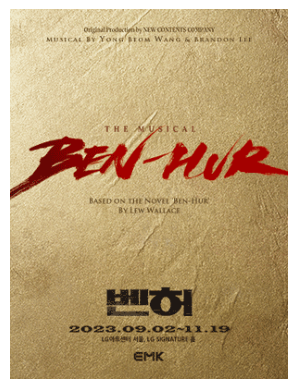

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 ＇벤허＇.png - 유사도: 0.36741870641708374


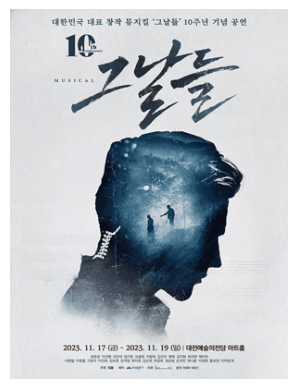

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈그날들〉 10주년 기념 공연 - 대전.png - 유사도: 0.3612419068813324


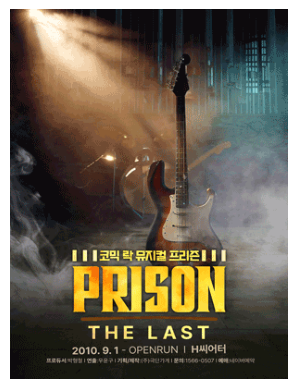

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 프리즌.gif - 유사도: 0.36087676882743835


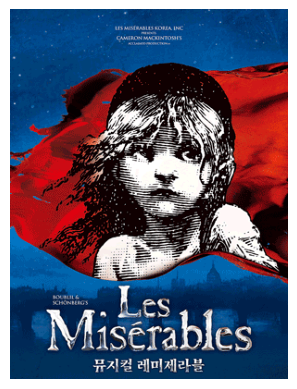

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈레미제라블〉 - 부산.png - 유사도: 0.35215243697166443


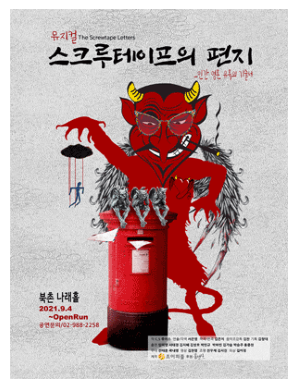

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 스크루테이프의 편지.gif - 유사도: 0.34352919459342957


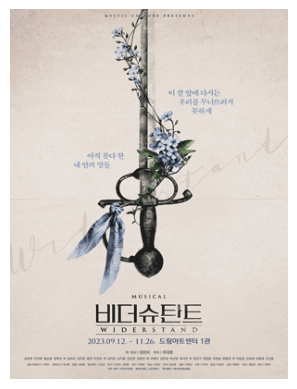

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈비더슈탄트〉.png - 유사도: 0.3370848596096039


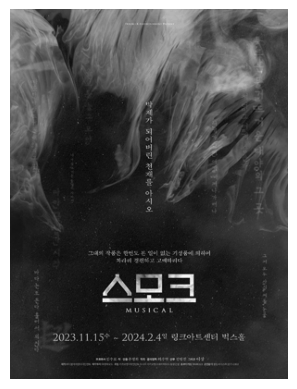

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈스모크〉.png - 유사도: 0.33648785948753357


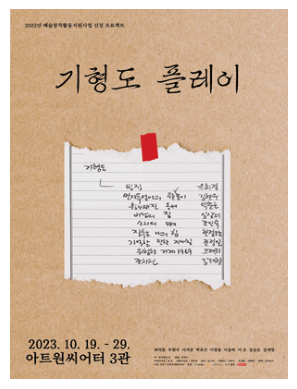

/content/drive/MyDrive/캡스톤/데이터/포스터/연극 〈기형도 플레이〉.gif - 유사도: 0.335921972990036


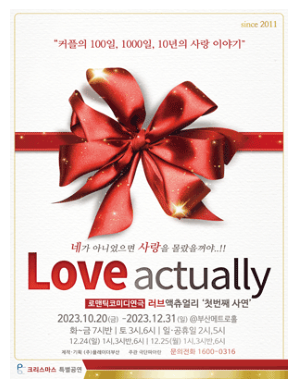

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023’셀러브리티 로코연극］러브액츄얼리 첫번째사연_크리스마스 특별공연 - 부산.gif - 유사도: 0.32882004976272583

파일: /content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈컴프롬어웨이〉.png
--------------------------------------------------------------------
추천 작품명과 유사도:


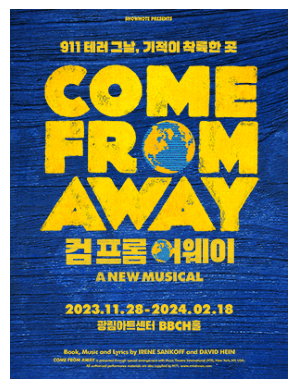

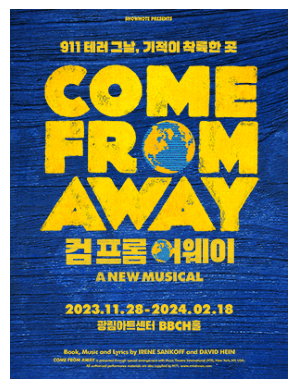

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈컴프롬어웨이〉.png - 유사도: 1.0000001192092896


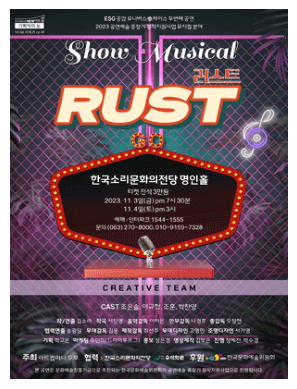

/content/drive/MyDrive/캡스톤/데이터/포스터/러스트(RUST) - 전주.gif - 유사도: 0.5500267744064331


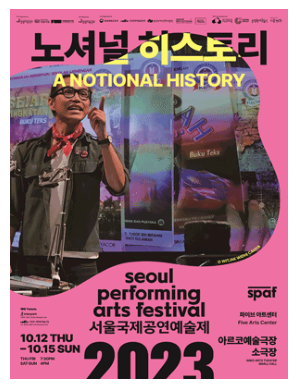

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 파이브 아트 센터 〈노셔널 히스토리〉.gif - 유사도: 0.5260672569274902


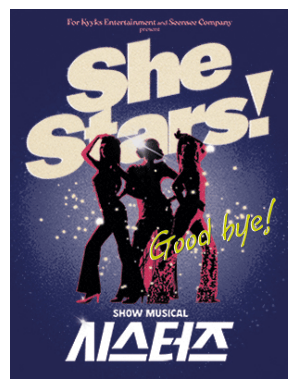

/content/drive/MyDrive/캡스톤/데이터/포스터/쇼 뮤지컬 〈시스터즈 (SheStars!)〉.png - 유사도: 0.5249166488647461


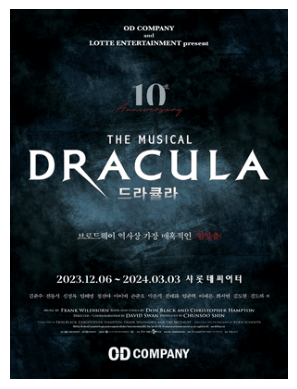

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 드라큘라 (Dracula：The Musical).png - 유사도: 0.5069907903671265


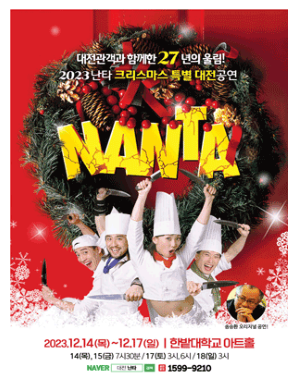

/content/drive/MyDrive/캡스톤/데이터/포스터/2023송승환의 오리지널 난타(대전).png - 유사도: 0.5066053867340088


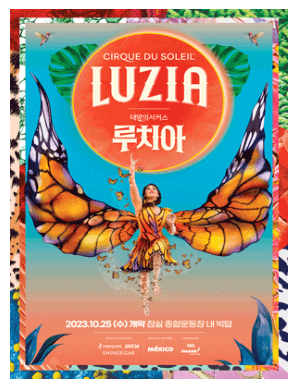

/content/drive/MyDrive/캡스톤/데이터/포스터/태양의서커스 〈루치아〉.png - 유사도: 0.49859803915023804


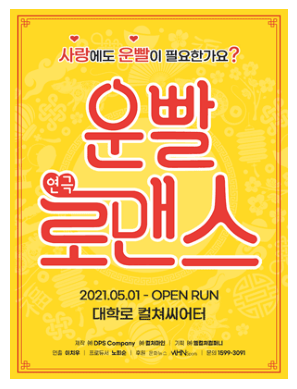

/content/drive/MyDrive/캡스톤/데이터/포스터/연극 〈운빨로맨스〉- 대학로.png - 유사도: 0.4946818947792053


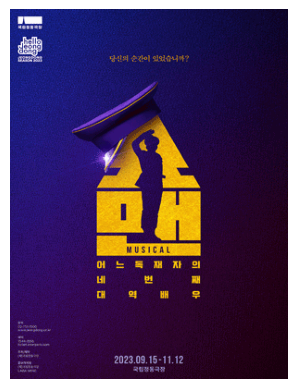

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈쇼맨_어느 독재자의 네 번째 대역배우〉.png - 유사도: 0.4943541884422302


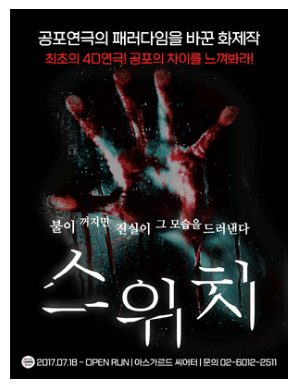

/content/drive/MyDrive/캡스톤/데이터/포스터/4D공포연극 〈스위치〉.png - 유사도: 0.49315008521080017

파일: /content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈삼총사〉.png
--------------------------------------------------------------------
추천 작품명과 유사도:


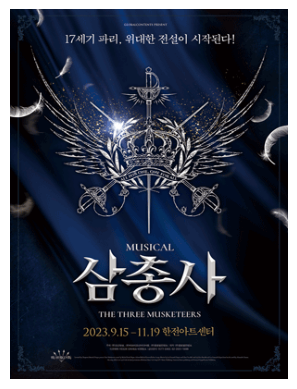

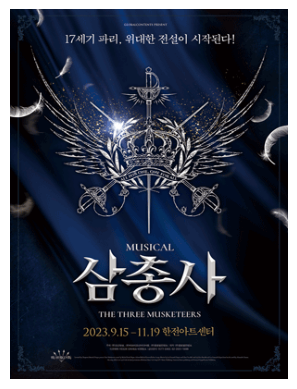

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈삼총사〉.png - 유사도: 1.000000238418579


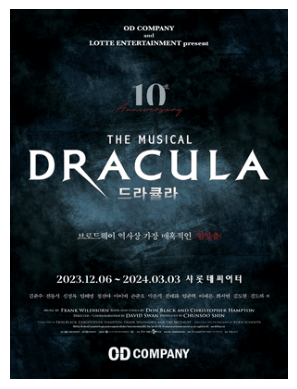

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 드라큘라 (Dracula：The Musical).png - 유사도: 0.5120468139648438


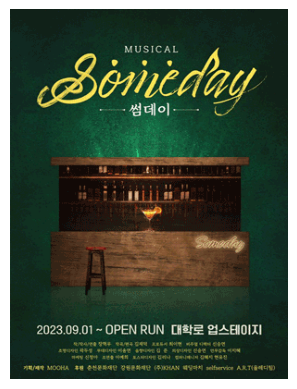

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 썸데이.gif - 유사도: 0.49035191535949707


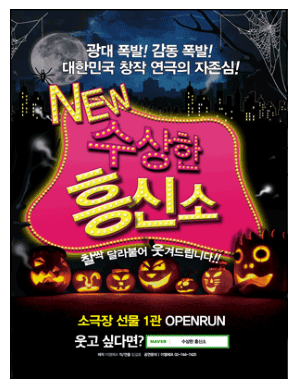

/content/drive/MyDrive/캡스톤/데이터/포스터/연극 〈수상한흥신소〉.png - 유사도: 0.4878026247024536


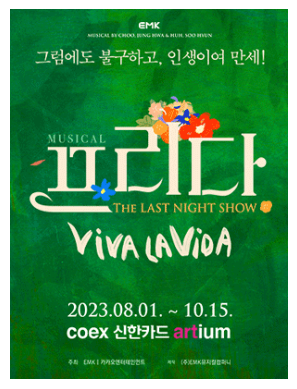

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈프리다〉.gif - 유사도: 0.4597037732601166


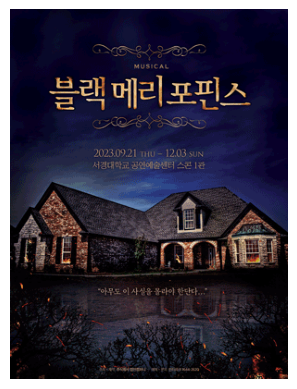

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈블랙메리포핀스〉.png - 유사도: 0.459118127822876


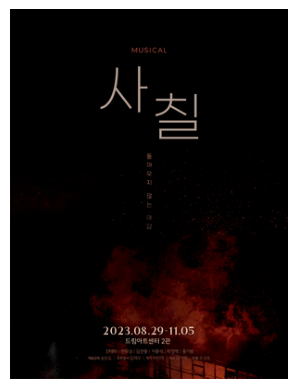

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈사칠〉.gif - 유사도: 0.4464718997478485


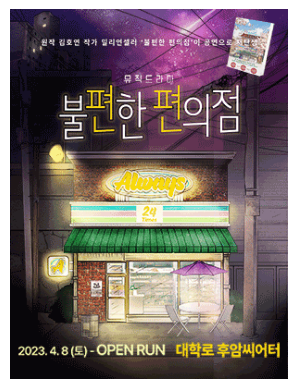

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤직드라마 〈불편한 편의점〉.png - 유사도: 0.4461441934108734


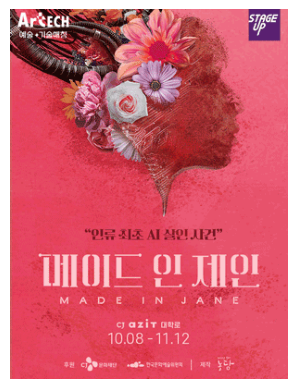

/content/drive/MyDrive/캡스톤/데이터/포스터/메이드 인 제인.png - 유사도: 0.4425620138645172


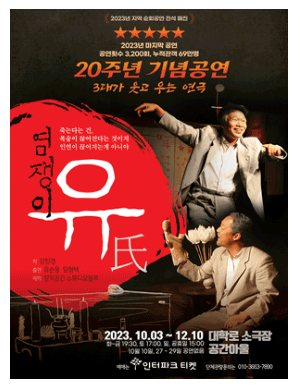

/content/drive/MyDrive/캡스톤/데이터/포스터/3대가 웃고 우는 연극 〈염쟁이 유씨〉.png - 유사도: 0.4329233169555664

파일: /content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 구자하 캄포 〈하마티아 3부작: 한국 연극의 역사〉.gif
--------------------------------------------------------------------
추천 작품명과 유사도:


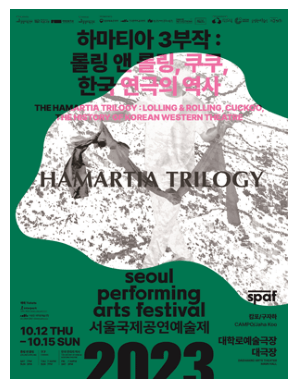

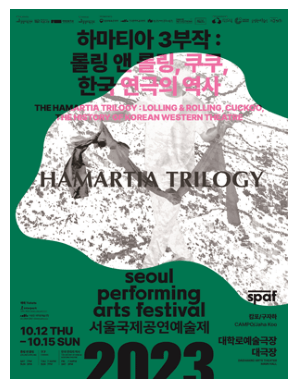

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 구자하 캄포 〈하마티아 3부작: 롤링 앤 롤링〉.gif - 유사도: 1.0


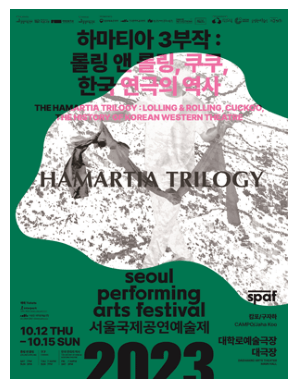

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 구자하 캄포 〈하마티아 3부작: 한국 연극의 역사〉.gif - 유사도: 1.0


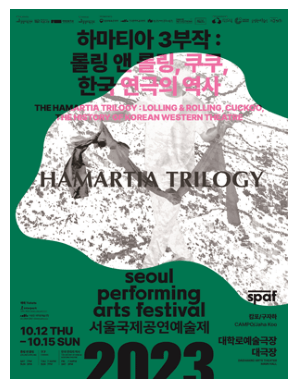

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 구자하 캄포 〈하마티아 3부작: 쿠쿠〉.gif - 유사도: 1.0


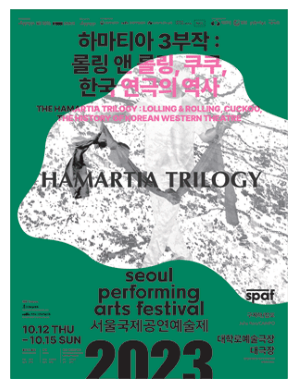

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ SPAF 하마티아 3부작 패키지.gif - 유사도: 0.930314302444458


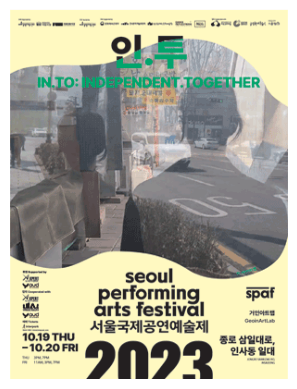

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 거인아트랩 〈인.투〉.gif - 유사도: 0.6191701292991638


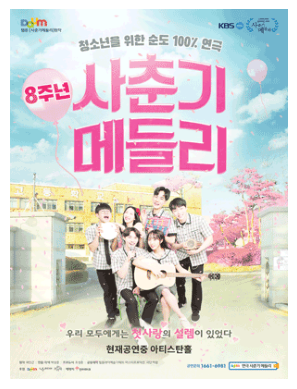

/content/drive/MyDrive/캡스톤/데이터/포스터/대학로 청소년연극 〈사춘기메들리〉.gif - 유사도: 0.6013154983520508


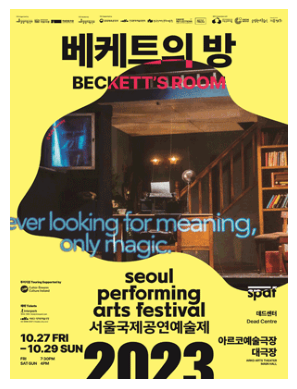

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 데드센터 〈베케트의 방〉.gif - 유사도: 0.5690671801567078


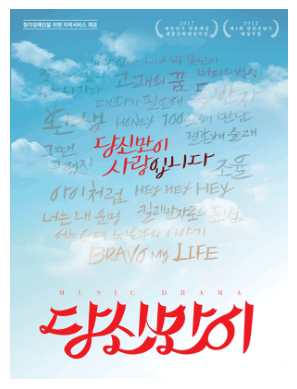

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤직드라마 당신만이.gif - 유사도: 0.562016487121582


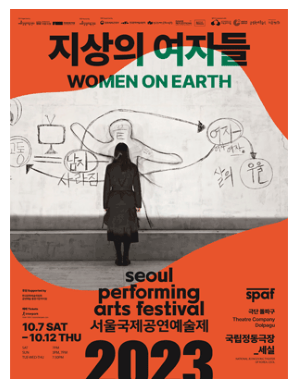

/content/drive/MyDrive/캡스톤/데이터/포스터/［2023 SPAF］ 극단 돌파구 〈지상의 여자들〉.gif - 유사도: 0.5603740811347961


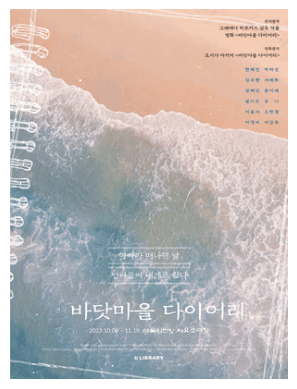

/content/drive/MyDrive/캡스톤/데이터/포스터/연극 〈바닷마을 다이어리〉.png - 유사도: 0.5603122115135193

파일: /content/drive/MyDrive/캡스톤/데이터/포스터/메이드 인 제인.png
--------------------------------------------------------------------
추천 작품명과 유사도:


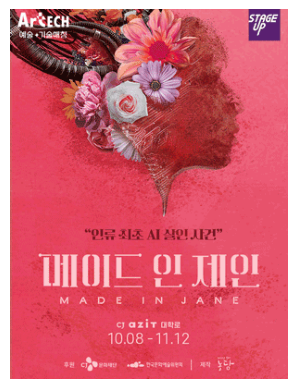

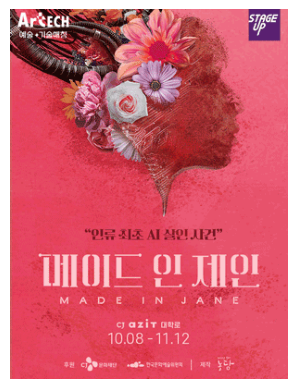

/content/drive/MyDrive/캡스톤/데이터/포스터/메이드 인 제인.png - 유사도: 1.0000001192092896


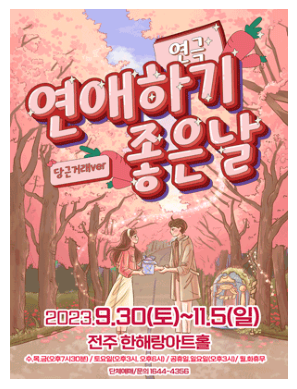

/content/drive/MyDrive/캡스톤/데이터/포스터/［연애하기 좋은 날  당근거래］ - 전주.gif - 유사도: 0.5624753832817078


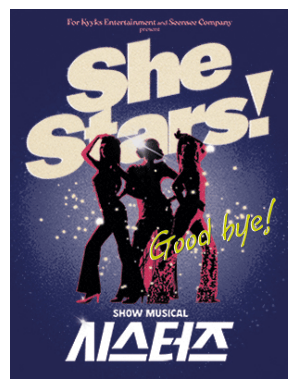

/content/drive/MyDrive/캡스톤/데이터/포스터/쇼 뮤지컬 〈시스터즈 (SheStars!)〉.png - 유사도: 0.5605939626693726


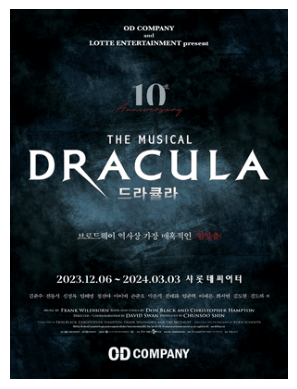

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 드라큘라 (Dracula：The Musical).png - 유사도: 0.5504478216171265


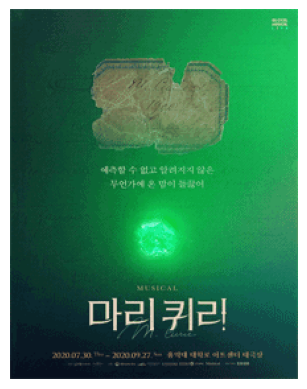

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈마리 퀴리〉.gif - 유사도: 0.5501508116722107


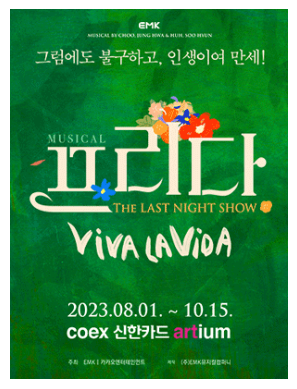

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈프리다〉.gif - 유사도: 0.5232910513877869


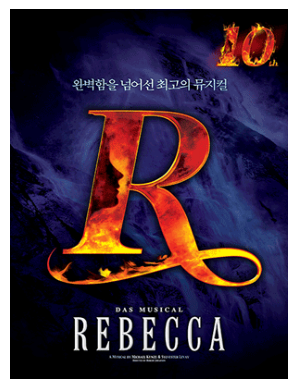

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 〈레베카〉 10주년 기념공연.png - 유사도: 0.5205075144767761


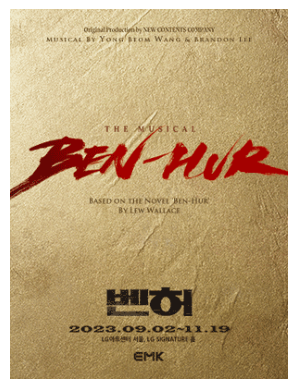

/content/drive/MyDrive/캡스톤/데이터/포스터/뮤지컬 ＇벤허＇.png - 유사도: 0.5170902609825134


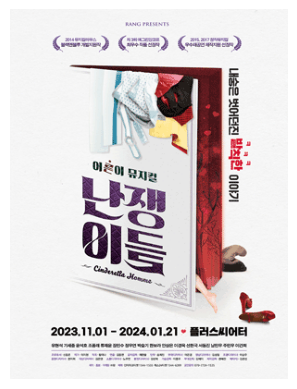

/content/drive/MyDrive/캡스톤/데이터/포스터/어른이 뮤지컬 〈난쟁이들〉.png - 유사도: 0.5118204355239868


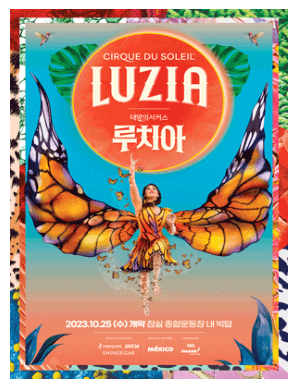

/content/drive/MyDrive/캡스톤/데이터/포스터/태양의서커스 〈루치아〉.png - 유사도: 0.5073315501213074



In [10]:
features_array = np.array(imgs_features)

# 각 작품간의 코사인 유사도 계산
similarities = cosine_similarity(features_array)

num_images = len(imgs_features)

# 랜덤으로 5개의 이미지만 유사도가 높은 10개의 이미지를 출력
random_files = random.sample(files, 5)

for file in random_files:
    file_index = files.index(file)

    file_similarities = similarities[file_index]

    top_10 = file_similarities.argsort()[::-1][:10]

    print(f"파일: {file}")
    print(f"--------------------------------------------------------------------")
    print("추천 작품명과 유사도:")

    img_path = file
    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # 유사한 이미지 출력
    for idx in top_10:
        similar_file = files[idx]
        similarity = file_similarities[idx]
        similar_img_path = similar_file

        similar_img = Image.open(similar_img_path)
        plt.imshow(similar_img)
        plt.axis('off')
        plt.show()

        print(f"{similar_file} - 유사도: {similarity}")

    print()